In [11]:
import pandas as pd
import numpy as np
import requests

In [12]:
from sharetop import ShareTop
# 填入你的 sharetop token
SHARETOP_TOKEN = "0a84c795399adfa0ef4f3caa41cabc7ef5e63813242fe7e452"
client = ShareTop(token=SHARETOP_TOKEN)

In [13]:
value_list = {
    "REPORT_DATE_NAME": "年份",
    "TOTALOPERATEREVE": "营业总收入(元)",
    "ROEJQ": "净资产收益率(ROE)",
    "ROEKCJQ": "净资产收益率(扣非/加权)",
    "TOTALOPERATEREVETZ": "营业总收入同比增长(%)",
    "PARENTNETPROFIT": "归属净利润(元)",
    "KCFJCXSYJLR": "扣非净利润(元)",
    "XSMLL": "毛利率(%)",
    "XSJLL": "净利率(%)",
    "CHZZL": "存货周转率(次)",
    "YSZKZZL": "应收账款周转率(次)",
    "TOAZZL": "总资产周转率(次)",
    "LD": "流动比率",
    "SD": "速动比率",
    "QYCS": "权益系数",
    "NETCASH_OPERATE": "经营活动现金流净额"
}

In [14]:
dict_data = {
    "REPORT_DATE_NAME": "年份",
    "TOTALOPERATEREVE": "营业总收入(元)",
    "ROEJQ": "净资产收益率(ROE)",
    "ROEKCJQ": "净资产收益率(扣非/加权)",
    "TOTALOPERATEREVETZ": "营业总收入同比增长(%)",
    "PARENTNETPROFIT": "归属净利润(元)",
    "KCFJCXSYJLR": "扣非净利润(元)",
    "XSMLL": "毛利率(%)",
    "XSJLL": "净利率(%)",
    "CHZZL": "存货周转率(次)",
    "YSZKZZL": "应收账款周转率(次)",
    "TOAZZL": "总资产周转率(次)",
    "LD": "流动比率",
    "SD": "速动比率",
    "QYCS": "权益系数",
    "SALES_SERVICES": "销售商品、提供劳务收到的现金",
    "RESEARCH_EXPENSE": "研发费用",
    "RESEARCH_TOTALOPERATEREVE": "研发费用占总营收的比率",
    "RESEARCH_PARENTNETPROFIT": "研发费用占归母净利率的比率",
    "SALES_SERVICES_TOTALOPERATEREVE": "总营收的现金比率",
    "KCFJCXSYJLR_PARENTNETPROFIT": "扣非净利润占归属净利润比率",
    "TOTAL_CURRENT_LIAB_TOTAL_CURRENT_ASSETS": "流动负债占流动资产比率",
    "TOTAL_LIABILITIES_TOTAL_ASSETS": "负债合计占资产总计比率",
    "ROEJQ_pct": "净资产收益率(ROE)同比增长率",
    "ROEKCJQ_pct": "净资产收益率(扣非/加权)同比增长率",
    "PARENTNETPROFIT_pct": "归属净利润(元)同比增长率",
    "KCFJCXSYJLR_pct": "扣非净利润(元)同比增长率",
    "CHZZL_pct": "存货周转率(次)同比增长率",
    "YSZKZZL_pct": "应收账款周转率(次)同比增长率",
    "TOAZZL_pct": "总资产周转率(次)同比增长率",
    "LD_pct": "流动比率同比增长率",
    "SD_pct": "速动比率同比增长率",
    "XSJLL_pct": "净利率(%)同比增长率",
    "QYCS_pct": "权益系数同比增长率",
    "NETCASH_OPERATE": "经营活动现金流净额",
    "NETCASH_OPERATE_pct": "经营活动现金流净额同比增长率(%)",
    "NETCASH_INVEST": "投资活动现金流净额",
    "NETCASH_INVEST_pct": "投资活动现金流净额同比增长率(%)",
    "NETCASH_FINANCE": "筹资活动现金流净额",
    "NETCASH_FINANCE_pct": "筹资活动现金流净额同比增长率(%)",
    "TOTAL_CURRENT_LIAB_pct": "流动负债合计同比增长率(%)",
    "TOTAL_NONCURRENT_LIAB_pct": "非流动负债合计同比增长率(%)",
    "TOTAL_LIABILITIES_pct": "负债合计同比增长率(%)",
    "TOTAL_CURRENT_ASSETS_pct": "流动资产合计同比增长率(%)",
    "TOTAL_NONCURRENT_ASSETS_pct": "非流动资产合计同比增长率(%)",
    "TOTAL_ASSETS_pct": "资产总计同比增长率(%)",
    "TOTAL_CURRENT_LIAB": "流动负债合计",
    "TOTAL_NONCURRENT_LIAB": "非流动负债合计",
    "TOTAL_LIABILITIES": "负债合计",
    "TOTAL_CURRENT_ASSETS": "流动资产合计",
    "TOTAL_NONCURRENT_ASSETS": "非流动资产合计",
    "TOTAL_ASSETS": "资产总计",
    "CONSTRUCT_LONG_ASSET": "资本开支",
    "CONSTRUCT_LONG_ASSET_PARENTNETPROFIT": "资本开支占净利润的比率(%)"
}

In [16]:
# sharetop 返回字段 -> 原东财内部英文字段名（保持下游 column_mapping / pct / 比率计算不变）
# 字段名以 sharetop 官方文档(api/fundamental_data/*)为准
_CORE_MAP = {
    "total_operating_revenue": "TOTALOPERATEREVE",        # 营业总收入
    "roe_weighted": "ROEJQ",                              # 净资产收益率(ROE)
    "roe_deducted_weighted": "ROEKCJQ",                  # 净资产收益率(扣非/加权)
    "total_operating_revenue_yoy": "TOTALOPERATEREVETZ", # 营业总收入同比增长
    "net_profit_attributable": "PARENTNETPROFIT",      # 归属净利润
    "deducted_net_profit": "KCFJCXSYJLR",                # 扣非净利润
    "gross_profit_margin": "XSMLL",                      # 毛利率
    "net_profit_margin": "XSJLL",                        # 净利率
    "inventory_turnover": "CHZZL",                       # 存货周转率
    "receivables_turnover": "YSZKZZL",                   # 应收账款周转率
    "total_asset_turnover": "TOAZZL",                    # 总资产周转率
    "current_ratio": "LD",                               # 流动比率
    "quick_ratio": "SD",                                 # 速动比率
    "equity_multiplier": "QYCS",                          # 权益系数
}
_INCOME_MAP = {"research_expense": "RESEARCH_EXPENSE"}   # 研发费用(利润表)
_CASH_MAP = {
    "sales_and_services": "SALES_SERVICES",               # 销售商品、提供劳务收到的现金
    "net_cash_from_operating": "NETCASH_OPERATE",        # 经营活动现金流净额
    "net_cash_from_investing": "NETCASH_INVEST",         # 投资活动现金流净额
    "net_cash_from_financing": "NETCASH_FINANCE",        # 筹资活动现金流净额
    "acquisition_of_long_lived_assets": "CONSTRUCT_LONG_ASSET",  # 资本开支(购建长期资产支付的现金)
}
_BAL_MAP = {
    "total_current_liabilities": "TOTAL_CURRENT_LIAB",       # 流动负债合计
    "total_non_current_liabilities": "TOTAL_NONCURRENT_LIAB", # 非流动负债合计
    "total_liabilities": "TOTAL_LIABILITIES",                # 负债合计
    "total_current_assets": "TOTAL_CURRENT_ASSETS",          # 流动资产合计
    "total_non_current_assets": "TOTAL_NONCURRENT_ASSETS",   # 非流动资产合计
    "total_assets": "TOTAL_ASSETS",                           # 资产总计
}


def _fetch_df(getter, symbol, start_year, fields=None, report_type=None, report_class=None):
    """调用 sharetop.financials.*，返回该证券按报告期降序的 DataFrame(含 report_date 列)。

    fields: 逗号分隔的字段名。文档里“非默认展示”的字段必须显式请求才会返回。
    getter: client.financials.core_financial_indicators / income / cash_flow / balance_sheet
    symbol: 完整证券代码, 如 '600054.SH'
    """
    import nest_asyncio
    nest_asyncio.apply()
    kw = {"symbols": [symbol], "start_date": f"{start_year}-01-01", "as_df": True}
    if fields:
        kw["fields"] = fields
    if report_type:
        kw["report_type"] = report_type    # 年报/中报/三季报/一季报
    if report_class:
        kw["report_class"] = report_class  # R=报告期, Q=单季度
    df = getter(**kw).get(symbol)
    if df is None or df.empty:
        print(f"[sharetop] 未获取到 {symbol} 的数据: {getter.__name__}")
        return pd.DataFrame()
    df = df.sort_values("report_date", ascending=False, na_position="last")
    return df.reset_index(drop=True)

In [17]:
pct_list = ["ROEJQ", "ROEKCJQ", "PARENTNETPROFIT", "KCFJCXSYJLR", "CHZZL", "YSZKZZL", "TOAZZL", "LD", "SD", "XSJLL", "QYCS", "RESEARCH_EXPENSE", 
            "NETCASH_OPERATE", "NETCASH_INVEST", "NETCASH_FINANCE", "TOTAL_CURRENT_LIAB", "TOTAL_NONCURRENT_LIAB", "TOTAL_LIABILITIES",
           "TOTAL_CURRENT_ASSETS", "TOTAL_NONCURRENT_ASSETS", "TOTAL_ASSETS"]
mean_list = ["LD", "SD", "ROEJQ", "ROEKCJQ", "XSMLL", "XSJLL", "QYCS", "KCFJCXSYJLR_PARENTNETPROFIT", "SALES_SERVICES_TOTALOPERATEREVE", "PARENTNETPROFIT_pct", "KCFJCXSYJLR_pct"]


In [18]:
def run(code, mode, year=5):
    """用 sharetop 财报数据替代原东财接口，输出列名与旧版(英文内部字段)一致。

    依次拉取 core_financial_indicators(核心指标)、income(利润表)、
    cash_flow(现金流量表)、balance_sheet(资产负债表)。文档里非默认展示的字段
    一律通过 fields 显式请求，以报告期 report_date 为键合并。
    """
    import datetime
    symbol = f"{code}.{mode}"
    start_year = datetime.date.today().year - year - 1  # 多取一年，保证覆盖最近 n 份年报

    # fields 显式点名需要的字段（默认只返回“展示=是”的字段）
    core_f = ",".join(["ts_code", "report_date"] + list(_CORE_MAP.keys()))
    cash_f = ",".join(["ts_code", "report_date"] + list(_CASH_MAP.keys()))
    bal_f = ",".join(["ts_code", "report_date"] + list(_BAL_MAP.keys()))
    # 利润表：inc_report 里 research_expense 只在报告期(R)非年报过滤下返回，故不传 report_type
    inc_f = ",".join(["ts_code", "report_date"] + list(_INCOME_MAP.keys()))

    core_df = _fetch_df(client.financials.core_financial_indicators, symbol, start_year, fields=core_f, report_type="年报")
    income_df = _fetch_df(client.financials.income, symbol, start_year, fields=inc_f, report_class="R")
    cash_df = _fetch_df(client.financials.cash_flow, symbol, start_year, fields=cash_f, report_type="年报", report_class="R")
    bal_df = _fetch_df(client.financials.balance_sheet, symbol, start_year, fields=bal_f, report_type="年报")

    core_df = core_df.rename(columns=_CORE_MAP)[["report_date"] + list(_CORE_MAP.values())]
    # 利润表保留年报(12-31)报告期
    income_df = income_df.rename(columns=_INCOME_MAP)
    income_df = income_df[pd.to_datetime(income_df["report_date"]).dt.month == 12]
    income_df = income_df[["report_date", "RESEARCH_EXPENSE"]].drop_duplicates("report_date")
    cash_df = cash_df.rename(columns=_CASH_MAP)[["report_date"] + list(_CASH_MAP.values())]
    bal_df = bal_df.rename(columns=_BAL_MAP)[["report_date"] + list(_BAL_MAP.values())]

    merge_last_df = (core_df.merge(income_df, on="report_date", how="inner")
                           .merge(cash_df, on="report_date", how="inner")
                           .merge(bal_df, on="report_date", how="inner"))
    merge_last_df = merge_last_df.head(year).reset_index(drop=True)  # 年报按年份取前 year 期
    merge_last_df["REPORT_DATE_NAME"] = pd.to_datetime(merge_last_df["report_date"]).dt.year.astype(str)
    merge_last_df = merge_last_df.drop(columns=["report_date"])

    for item in pct_list:
        pct_field = f"{item}_pct"
        reversed_series = merge_last_df[item][::-1]
        diff_series = reversed_series.diff()
        abs_shift_series = reversed_series.shift().abs()
        pct_series = (diff_series / abs_shift_series) * 100
        merge_last_df[pct_field] = pct_series.replace([np.inf, -np.inf], np.nan)

    merge_last_df['RESEARCH_TOTALOPERATEREVE'] = (merge_last_df['RESEARCH_EXPENSE'] / merge_last_df['TOTALOPERATEREVE']) * 100
    merge_last_df['RESEARCH_PARENTNETPROFIT'] = (merge_last_df['RESEARCH_EXPENSE'] / merge_last_df['PARENTNETPROFIT']) * 100
    merge_last_df['KCFJCXSYJLR_PARENTNETPROFIT'] = (merge_last_df['KCFJCXSYJLR'] / merge_last_df['PARENTNETPROFIT']) * 100
    merge_last_df['SALES_SERVICES_TOTALOPERATEREVE'] = (merge_last_df['SALES_SERVICES'] / merge_last_df['TOTALOPERATEREVE']) * 100
    merge_last_df['CONSTRUCT_LONG_ASSET_PARENTNETPROFIT'] = (merge_last_df['CONSTRUCT_LONG_ASSET'] / merge_last_df['PARENTNETPROFIT']) * 100
    merge_last_df['TOTAL_CURRENT_LIAB_TOTAL_CURRENT_ASSETS'] = (merge_last_df['TOTAL_CURRENT_LIAB'] / merge_last_df['TOTAL_CURRENT_ASSETS']) * 100
    merge_last_df['TOTAL_LIABILITIES_TOTAL_ASSETS'] = (merge_last_df['TOTAL_LIABILITIES'] / merge_last_df['TOTAL_ASSETS']) * 100

    for col in ['RESEARCH_TOTALOPERATEREVE', 'RESEARCH_PARENTNETPROFIT', 'KCFJCXSYJLR_PARENTNETPROFIT',
                'SALES_SERVICES_TOTALOPERATEREVE', 'CONSTRUCT_LONG_ASSET_PARENTNETPROFIT',
                'TOTAL_CURRENT_LIAB_TOTAL_CURRENT_ASSETS', 'TOTAL_LIABILITIES_TOTAL_ASSETS']:
        merge_last_df[col] = merge_last_df[col].replace([np.inf, -np.inf], np.nan)

    return merge_last_df

In [19]:
last_merge_df = run("603993", "SH", 10)

In [20]:
last_merge_df

,TOTALOPERATEREVE,ROEJQ,ROEKCJQ,TOTALOPERATEREVETZ,PARENTNETPROFIT,KCFJCXSYJLR,XSMLL,XSJLL,CHZZL,YSZKZZL,...,TOTAL_CURRENT_ASSETS_pct,TOTAL_NONCURRENT_ASSETS_pct,TOTAL_ASSETS_pct,RESEARCH_TOTALOPERATEREVE,RESEARCH_PARENTNETPROFIT,KCFJCXSYJLR_PARENTNETPROFIT,SALES_SERVICES_TOTALOPERATEREVE,CONSTRUCT_LONG_ASSET_PARENTNETPROFIT,TOTAL_CURRENT_LIAB_TOTAL_CURRENT_ASSETS,TOTAL_LIABILITIES_TOTAL_ASSETS
0,2.066836e+11,26.61,26.70,-2.98,2.033875e+10,2.040725e+10,23.93,11.63,4.46,222.49,...,39.373380,-0.524589,18.031354,0.208860,2.122448,100.336815,97.823587,37.285869,64.429362,50.338151
1,2.130287e+11,20.96,20.32,14.37,1.353204e+10,1.311883e+10,16.55,7.26,5.80,239.37,...,-5.347663,1.942405,-1.582949,0.166163,2.615822,96.946438,100.942741,36.220119,57.418308,49.515955
2,1.862690e+11,15.00,11.31,7.68,8.249712e+09,6.232811e+09,9.72,4.58,5.28,192.80,...,-2.374144,12.591182,4.820839,0.175598,3.964807,75.551867,101.306406,156.664843,58.555514,58.397243
3,1.729909e+11,13.41,13.41,-0.50,6.066947e+09,6.066908e+09,9.29,4.16,5.30,223.77,...,20.753615,19.315363,20.057834,0.224642,6.405359,99.999370,104.696636,173.361660,58.426785,62.405945
4,1.738626e+11,12.93,10.39,53.89,5.106017e+09,4.103233e+09,9.39,3.12,6.55,240.13,...,23.962825,1.981986,12.257734,0.156667,5.334583,80.360737,102.904086,83.855486,71.396575,64.885928
5,1.129810e+11,5.83,2.78,64.51,2.328788e+09,1.090576e+09,7.47,2.19,4.99,102.12,...,5.652053,4.015145,4.774018,0.153639,7.453789,46.830226,110.133562,327.285727,74.001044,61.340761
6,6.867657e+10,4.54,1.85,164.52,1.857014e+09,7.466852e+08,4.47,2.57,4.80,57.92,...,38.333604,1.020099,15.458120,0.390702,14.449049,40.208912,104.528019,146.397493,63.818675,57.646198
7,2.596286e+10,11.72,11.54,7.52,4.635584e+09,4.560179e+09,37.68,19.84,2.63,17.28,...,0.296004,5.550895,3.453563,0.979692,5.487033,98.373335,112.635479,60.561246,40.799151,50.997987
8,2.414756e+10,9.89,11.25,247.47,2.727796e+09,3.125344e+09,37.00,14.89,2.82,13.39,...,97.186712,-13.700476,11.274333,0.421549,3.731722,114.573946,101.849842,39.096619,34.580087,53.076015
9,6.949571e+09,5.52,5.03,65.59,9.980406e+08,9.076684e+08,33.47,14.67,1.63,6.30,...,NaN,NaN,NaN,NaN,NaN,90.945035,110.005029,85.593864,80.703480,60.947198


In [21]:
def safe_rename_columns(df, mapping_dict):
    """
    安全重命名列，只重命名存在的列
    
    Args:
        df: pandas DataFrame
        mapping_dict: 列名映射字典 {英文: 中文}
    
    Returns:
        重命名后的DataFrame
    """
    # 只选择存在的列进行重命名
    valid_mapping = {old: new for old, new in mapping_dict.items() 
                    if old in df.columns}
    
    # 找出不存在的列
    missing_cols = set(mapping_dict.keys()) - set(df.columns)
    if missing_cols:
        print(f"警告: 以下列不存在: {missing_cols}")
    
    return df.rename(columns=valid_mapping)

In [22]:
column_mapping = {
    "REPORT_DATE_NAME": "年份",
    "TOTALOPERATEREVE": "营业总收入",
    "ROEJQ": "净资产收益率(ROE)(%)",
    "ROEKCJQ": "净资产收益率(扣非/加权)(%)",
    "TOTALOPERATEREVETZ": "营业总收入同比增长率(%)",
    "PARENTNETPROFIT": "归属净利润",
    "KCFJCXSYJLR": "扣非净利润",
    "XSMLL": "毛利率(%)",
    "XSJLL": "净利率(%)",
    "CHZZL": "存货周转率(次)",
    "YSZKZZL": "应收账款周转率(次)",
    "TOAZZL": "总资产周转率(次)",
    "LD": "流动比率",
    "SD": "速动比率",
    "QYCS": "权益系数",
    "SALES_SERVICES": "销售商品、提供劳务收到的现金",
    "RESEARCH_EXPENSE": "研发费用",
    "RESEARCH_TOTALOPERATEREVE": "研发费用占总营收的比率(%)",
    "RESEARCH_PARENTNETPROFIT": "研发费用占归母净利率的比率(%)",
    "SALES_SERVICES_TOTALOPERATEREVE": "现金占总营收的比率(%)",
    "KCFJCXSYJLR_PARENTNETPROFIT": "扣非净利润占归属净利润的比率(%)",
    "TOTAL_CURRENT_LIAB_TOTAL_CURRENT_ASSETS": "流动负债占流动资产比率(%)",
    "TOTAL_LIABILITIES_TOTAL_ASSETS": "负债合计占资产总计比率(%)",
    "ROEJQ_pct": "净资产收益率(ROE)同比增长率(%)",
    "ROEKCJQ_pct": "净资产收益率(扣非/加权)同比增长率(%)",
    "PARENTNETPROFIT_pct": "归属净利润同比增长率(%)",
    "KCFJCXSYJLR_pct": "扣非净利润同比增长率(%)",
    "CHZZL_pct": "存货周转率(次)同比增长率(%)",
    "YSZKZZL_pct": "应收账款周转率(次)同比增长率(%)",
    "TOAZZL_pct": "总资产周转率(次)同比增长率(%)",
    "LD_pct": "流动比率同比增长率(%)",
    "SD_pct": "速动比率同比增长率(%)",
    "XSJLL_pct": "净利率同比增长率(%)",
    "QYCS_pct": "权益系数同比增长率(%)",
    "RESEARCH_EXPENSE_pct": "研发费用同比增长率(%)",
    "NETCASH_OPERATE": "经营活动现金流净额",
    "NETCASH_OPERATE_pct": "经营活动现金流净额同比增长率(%)",
    "NETCASH_INVEST": "投资活动现金流净额",
    "NETCASH_INVEST_pct": "投资活动现金流净额同比增长率(%)",
    "NETCASH_FINANCE": "筹资活动现金流净额",
    "NETCASH_FINANCE_pct": "筹资活动现金流净额同比增长率(%)",
    "NETCASH_FINANCE_pct": "筹资活动现金流净额同比增长率(%)",
    "TOTAL_CURRENT_LIAB_pct": "流动负债合计同比增长率(%)",
    "TOTAL_NONCURRENT_LIAB_pct": "非流动负债合计同比增长率(%)",
    "TOTAL_LIABILITIES_pct": "负债合计同比增长率(%)",
    "TOTAL_CURRENT_ASSETS_pct": "流动资产合计同比增长率(%)",
    "TOTAL_NONCURRENT_ASSETS_pct": "非流动资产合计同比增长率(%)",
    "TOTAL_ASSETS_pct": "资产总计同比增长率(%)",
    "TOTAL_CURRENT_LIAB": "流动负债合计",
    "TOTAL_NONCURRENT_LIAB": "非流动负债合计",
    "TOTAL_LIABILITIES": "负债合计",
    "TOTAL_CURRENT_ASSETS": "流动资产合计",
    "TOTAL_NONCURRENT_ASSETS": "非流动资产合计",
    "TOTAL_ASSETS": "资产总计",
    "CONSTRUCT_LONG_ASSET": "资本开支",
    "CONSTRUCT_LONG_ASSET_PARENTNETPROFIT": "资本开支占净利润的比率(%)"
}
df_safe = safe_rename_columns(last_merge_df, column_mapping)

In [23]:
df_safe['年份'] = df_safe['年份'].str.replace('年报', '')
df_safe = df_safe.assign(公司类型=np.nan)
df_safe

,营业总收入,净资产收益率(ROE)(%),净资产收益率(扣非/加权)(%),营业总收入同比增长率(%),归属净利润,扣非净利润,毛利率(%),净利率(%),存货周转率(次),应收账款周转率(次),...,非流动资产合计同比增长率(%),资产总计同比增长率(%),研发费用占总营收的比率(%),研发费用占归母净利率的比率(%),扣非净利润占归属净利润的比率(%),现金占总营收的比率(%),资本开支占净利润的比率(%),流动负债占流动资产比率(%),负债合计占资产总计比率(%),公司类型
0,2.066836e+11,26.61,26.70,-2.98,2.033875e+10,2.040725e+10,23.93,11.63,4.46,222.49,...,-0.524589,18.031354,0.208860,2.122448,100.336815,97.823587,37.285869,64.429362,50.338151,NaN
1,2.130287e+11,20.96,20.32,14.37,1.353204e+10,1.311883e+10,16.55,7.26,5.80,239.37,...,1.942405,-1.582949,0.166163,2.615822,96.946438,100.942741,36.220119,57.418308,49.515955,NaN
2,1.862690e+11,15.00,11.31,7.68,8.249712e+09,6.232811e+09,9.72,4.58,5.28,192.80,...,12.591182,4.820839,0.175598,3.964807,75.551867,101.306406,156.664843,58.555514,58.397243,NaN
3,1.729909e+11,13.41,13.41,-0.50,6.066947e+09,6.066908e+09,9.29,4.16,5.30,223.77,...,19.315363,20.057834,0.224642,6.405359,99.999370,104.696636,173.361660,58.426785,62.405945,NaN
4,1.738626e+11,12.93,10.39,53.89,5.106017e+09,4.103233e+09,9.39,3.12,6.55,240.13,...,1.981986,12.257734,0.156667,5.334583,80.360737,102.904086,83.855486,71.396575,64.885928,NaN
5,1.129810e+11,5.83,2.78,64.51,2.328788e+09,1.090576e+09,7.47,2.19,4.99,102.12,...,4.015145,4.774018,0.153639,7.453789,46.830226,110.133562,327.285727,74.001044,61.340761,NaN
6,6.867657e+10,4.54,1.85,164.52,1.857014e+09,7.466852e+08,4.47,2.57,4.80,57.92,...,1.020099,15.458120,0.390702,14.449049,40.208912,104.528019,146.397493,63.818675,57.646198,NaN
7,2.596286e+10,11.72,11.54,7.52,4.635584e+09,4.560179e+09,37.68,19.84,2.63,17.28,...,5.550895,3.453563,0.979692,5.487033,98.373335,112.635479,60.561246,40.799151,50.997987,NaN
8,2.414756e+10,9.89,11.25,247.47,2.727796e+09,3.125344e+09,37.00,14.89,2.82,13.39,...,-13.700476,11.274333,0.421549,3.731722,114.573946,101.849842,39.096619,34.580087,53.076015,NaN
9,6.949571e+09,5.52,5.03,65.59,9.980406e+08,9.076684e+08,33.47,14.67,1.63,6.30,...,NaN,NaN,NaN,NaN,90.945035,110.005029,85.593864,80.703480,60.947198,NaN


In [24]:
df_safe_set = df_safe.set_index('年份')
df_safe_set
columns_list1 = list(df_safe_set.columns)
all_columns = ['年份'] + columns_list1
print(all_columns)

['年份', '营业总收入', '净资产收益率(ROE)(%)', '净资产收益率(扣非/加权)(%)', '营业总收入同比增长率(%)', '归属净利润', '扣非净利润', '毛利率(%)', '净利率(%)', '存货周转率(次)', '应收账款周转率(次)', '总资产周转率(次)', '流动比率', '速动比率', '权益系数', '研发费用', '销售商品、提供劳务收到的现金', '经营活动现金流净额', '投资活动现金流净额', '筹资活动现金流净额', '资本开支', '流动负债合计', '非流动负债合计', '负债合计', '流动资产合计', '非流动资产合计', '资产总计', '净资产收益率(ROE)同比增长率(%)', '净资产收益率(扣非/加权)同比增长率(%)', '归属净利润同比增长率(%)', '扣非净利润同比增长率(%)', '存货周转率(次)同比增长率(%)', '应收账款周转率(次)同比增长率(%)', '总资产周转率(次)同比增长率(%)', '流动比率同比增长率(%)', '速动比率同比增长率(%)', '净利率同比增长率(%)', '权益系数同比增长率(%)', '研发费用同比增长率(%)', '经营活动现金流净额同比增长率(%)', '投资活动现金流净额同比增长率(%)', '筹资活动现金流净额同比增长率(%)', '流动负债合计同比增长率(%)', '非流动负债合计同比增长率(%)', '负债合计同比增长率(%)', '流动资产合计同比增长率(%)', '非流动资产合计同比增长率(%)', '资产总计同比增长率(%)', '研发费用占总营收的比率(%)', '研发费用占归母净利率的比率(%)', '扣非净利润占归属净利润的比率(%)', '现金占总营收的比率(%)', '资本开支占净利润的比率(%)', '流动负债占流动资产比率(%)', '负债合计占资产总计比率(%)', '公司类型']


In [25]:
df_loc = df_safe.loc[:, all_columns]
# df_loc = df_loc.assign(公司类型=np.nan)
df_loc


,年份,营业总收入,净资产收益率(ROE)(%),净资产收益率(扣非/加权)(%),营业总收入同比增长率(%),归属净利润,扣非净利润,毛利率(%),净利率(%),存货周转率(次),...,非流动资产合计同比增长率(%),资产总计同比增长率(%),研发费用占总营收的比率(%),研发费用占归母净利率的比率(%),扣非净利润占归属净利润的比率(%),现金占总营收的比率(%),资本开支占净利润的比率(%),流动负债占流动资产比率(%),负债合计占资产总计比率(%),公司类型
0,2025,2.066836e+11,26.61,26.70,-2.98,2.033875e+10,2.040725e+10,23.93,11.63,4.46,...,-0.524589,18.031354,0.208860,2.122448,100.336815,97.823587,37.285869,64.429362,50.338151,NaN
1,2024,2.130287e+11,20.96,20.32,14.37,1.353204e+10,1.311883e+10,16.55,7.26,5.80,...,1.942405,-1.582949,0.166163,2.615822,96.946438,100.942741,36.220119,57.418308,49.515955,NaN
2,2023,1.862690e+11,15.00,11.31,7.68,8.249712e+09,6.232811e+09,9.72,4.58,5.28,...,12.591182,4.820839,0.175598,3.964807,75.551867,101.306406,156.664843,58.555514,58.397243,NaN
3,2022,1.729909e+11,13.41,13.41,-0.50,6.066947e+09,6.066908e+09,9.29,4.16,5.30,...,19.315363,20.057834,0.224642,6.405359,99.999370,104.696636,173.361660,58.426785,62.405945,NaN
4,2021,1.738626e+11,12.93,10.39,53.89,5.106017e+09,4.103233e+09,9.39,3.12,6.55,...,1.981986,12.257734,0.156667,5.334583,80.360737,102.904086,83.855486,71.396575,64.885928,NaN
5,2020,1.129810e+11,5.83,2.78,64.51,2.328788e+09,1.090576e+09,7.47,2.19,4.99,...,4.015145,4.774018,0.153639,7.453789,46.830226,110.133562,327.285727,74.001044,61.340761,NaN
6,2019,6.867657e+10,4.54,1.85,164.52,1.857014e+09,7.466852e+08,4.47,2.57,4.80,...,1.020099,15.458120,0.390702,14.449049,40.208912,104.528019,146.397493,63.818675,57.646198,NaN
7,2018,2.596286e+10,11.72,11.54,7.52,4.635584e+09,4.560179e+09,37.68,19.84,2.63,...,5.550895,3.453563,0.979692,5.487033,98.373335,112.635479,60.561246,40.799151,50.997987,NaN
8,2017,2.414756e+10,9.89,11.25,247.47,2.727796e+09,3.125344e+09,37.00,14.89,2.82,...,-13.700476,11.274333,0.421549,3.731722,114.573946,101.849842,39.096619,34.580087,53.076015,NaN
9,2016,6.949571e+09,5.52,5.03,65.59,9.980406e+08,9.076684e+08,33.47,14.67,1.63,...,NaN,NaN,NaN,NaN,90.945035,110.005029,85.593864,80.703480,60.947198,NaN


In [26]:
df_melted = df_loc.melt(id_vars=['年份'], 
                    value_vars=columns_list1,
                    var_name='指标', 
                    value_name='数值')

df_result = df_melted.pivot(index='指标', columns='年份', values='数值')
df_result


年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
公司类型,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
净利率(%),1.467000e+01,1.489000e+01,1.984000e+01,2.570000e+00,2.190000e+00,3.120000e+00,4.160000e+00,4.580000e+00,7.260000e+00,1.163000e+01
净利率同比增长率(%),NaN,1.499659e+00,3.324379e+01,-8.704637e+01,-1.478599e+01,4.246575e+01,3.333333e+01,1.009615e+01,5.851528e+01,6.019284e+01
净资产收益率(ROE)(%),5.520000e+00,9.890000e+00,1.172000e+01,4.540000e+00,5.830000e+00,1.293000e+01,1.341000e+01,1.500000e+01,2.096000e+01,2.661000e+01
净资产收益率(ROE)同比增长率(%),NaN,7.916667e+01,1.850354e+01,-6.126280e+01,2.841410e+01,1.217839e+02,3.712297e+00,1.185682e+01,3.973333e+01,2.695611e+01
净资产收益率(扣非/加权)(%),5.030000e+00,1.125000e+01,1.154000e+01,1.850000e+00,2.780000e+00,1.039000e+01,1.341000e+01,1.131000e+01,2.032000e+01,2.670000e+01
净资产收益率(扣非/加权)同比增长率(%),NaN,1.236581e+02,2.577778e+00,-8.396880e+01,5.027027e+01,2.737410e+02,2.906641e+01,-1.565996e+01,7.966401e+01,3.139764e+01
存货周转率(次),1.630000e+00,2.820000e+00,2.630000e+00,4.800000e+00,4.990000e+00,6.550000e+00,5.300000e+00,5.280000e+00,5.800000e+00,4.460000e+00
存货周转率(次)同比增长率(%),NaN,7.300613e+01,-6.737589e+00,8.250951e+01,3.958333e+00,3.126253e+01,-1.908397e+01,-3.773585e-01,9.848485e+00,-2.310345e+01


In [27]:
def advanced_financial_analysis(df):
    """
    高级财务数据分析与美化
    """
    where_per_list = ['毛利率(%)', '净利率(%)', '扣非净利润占归属净利润的比率(%)', '现金占总营收的比率(%)', '研发费用占归母净利率的比率(%)',
                      '研发费用占总营收的比率(%)', '资本开支占净利润的比率(%)', '流动负债占流动资产比率(%)', '负债合计占资产总计比率(%)']
    filter_col_list = ['公司类型']
    choices = [
    '妖精型',
    '老母鸡',
    '创业型',
    '奶牛型',
    '跑路型',
    '咸鱼型',
    '赌徒型',
    '漏斗型'
     ]
    styled_df = df.copy()
    
    # 计算额外指标（用于工具提示等）
    def calculate_additional_metrics():
        """计算额外的财务指标"""
        metrics = {}
        # 计算复合年增长率 (CAGR)
        for row in styled_df.index:
            if '%' not in row and row not in filter_col_list:
                values = styled_df.loc[row]
                # 从2020到2024的CAGR
                start_val = values.iloc[0]
                end_val = values.iloc[-1]
                if start_val > 0 and end_val > 0:
                    cagr = ((end_val / start_val) ** (1/4) - 1) * 100
                    metrics[row] = f"CAGR: {cagr:.2f}%"
        
        return metrics
    
    additional_metrics = calculate_additional_metrics()
    
    # 数据格式化函数
    def format_financial_value(val, data_type):
        if pd.isna(val):
            return "-"
        
        if data_type == 'currency':
            # 货币格式化
            if abs(val) >= 1e8:  # 亿元
                return f"¥{val/1e8:.2f}亿"
            elif abs(val) >= 1e4:  # 万元
                return f"¥{val/1e4:.0f}万"
            else:
                return f"¥{val:,.0f}"
        elif data_type == 'percentage':
            # 百分比格式化
            if val > 0:
                return f"▲ {val:.2f}%"
            elif val < 0:
                return f"▼ {val:.2f}%"
            else:
                return f"{val:.2f}%"
        elif data_type in ['ratio', 'rate']:
            # 比率格式化 - 保留两位小数
            return f"{val:.2f}"
        elif data_type == 'where_per':
            return f"{val:.2f}%"
        return str(val)
    
    # 应用数据格式化
    for idx in styled_df.index:
        if idx in ['流动比率', '速动比率']:
            # 比率数据 - 保留两位小数
            styled_df.loc[idx] = [format_financial_value(x, 'ratio') for x in styled_df.loc[idx]]
        elif idx in ['权益系数','存货周转率(次)', '应收账款周转率(次)']:
            styled_df.loc[idx] = [format_financial_value(x, 'rate') for x in styled_df.loc[idx]]
        elif idx in where_per_list:
            styled_df.loc[idx] = [format_financial_value(x, 'where_per') for x in styled_df.loc[idx]]
        elif '%' not in idx and idx not in filter_col_list:
            styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
        elif '%' in idx and '占' not in idx:
            styled_df.loc[idx] = [format_financial_value(x, 'percentage') for x in styled_df.loc[idx]]
    
    # 创建高级样式
    def advanced_style(styler):
        # 更专业的颜色方案
        color_scheme = {
            'header_bg': '#34495e',
            'index_bg': '#ecf0f1',
            'positive_growth': '#27ae60',
            'negative_growth': '#e74c3c',
            'profit_bg': '#f8f9fa',
            'hover_bg': '#f1f8ff',
            'good_ratio': '#27ae60',      # 比率 > 1 的绿色
            'bad_ratio': '#c0392b'        # 比率 < 1 的深红色
        }
        
        styles = [
            # 基础表格样式
            {'selector': '', 'props': [
                ('border', '1px solid #ddd'),
                ('border-collapse', 'collapse'),
                ('font-family', 'Segoe UI, Arial, sans-serif'),
                ('width', '100%'),
                ('box-shadow', '0 2px 4px rgba(0,0,0,0.1)')
            ]},
            # 表头样式
            {'selector': 'thead th', 'props': [
                ('background-color', color_scheme['header_bg']),
                ('color', 'white'),
                ('font-weight', '600'),
                ('text-align', 'center'),
                ('padding', '14px 10px'),
                ('border', '1px solid #2c3e50'),
                ('font-size', '13px'),
                ('text-transform', 'uppercase'),
                ('letter-spacing', '0.5px')
            ]},
            # 索引列样式
            {'selector': 'tbody th', 'props': [
                ('background-color', color_scheme['index_bg']),
                ('font-weight', '600'),
                ('text-align', 'left'),
                ('padding', '12px 10px'),
                ('border', '1px solid #bdc3c7'),
                ('font-size', '12px'),
                ('color', '#2c3e50')
            ]},
            # 数据单元格样式
            {'selector': 'td', 'props': [
                ('text-align', 'center'),
                ('padding', '12px 10px'),
                ('border', '1px solid #e0e0e0'),
                ('font-size', '12px'),
                ('transition', 'all 0.2s ease')
            ]},
            # 悬停效果
            {'selector': 'tbody tr:hover td', 'props': [
                ('background-color', color_scheme['hover_bg']),
                ('transform', 'scale(1.01)')
            ]},
            {'selector': 'tbody tr:hover th', 'props': [
                ('background-color', '#d5dbdb')
            ]}
        ]
        
        styler.set_table_styles(styles)
        
        # 条件格式
        def growth_styling(val):
            if isinstance(val, str):
                if '▲' in val:
                    return f'color: {color_scheme["positive_growth"]}; font-weight: 600; background-color: #e8f5e8'
                elif '▼' in val:
                    return f'color: {color_scheme["negative_growth"]}; font-weight: 600; background-color: #fdeaea'
            return ''

        def ratio_styling(val, original_val):
            """比率颜色格式化"""
            if pd.isna(original_val):
                return ''
            
            # 对于比率数据，根据数值大小设置颜色
            if original_val < 1:
                return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
            else:
                return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
        
        def rate_styling(val, original_val):
            """比率颜色格式化"""
            if pd.isna(original_val):
                return ''
            
            # 对于比率数据，根据数值大小设置颜色
            if original_val > 3:
                return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
            else:
                return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'

        def where_per_styling(val, original_val, row_name):
            """占比颜色格式化"""
            if pd.isna(original_val):
                return ''
            if row_name == "现金占总营收的比率(%)":
                # 对于比率数据，根据数值大小设置颜色
                if original_val < 90:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '资本开支占净利润的比率(%)':
                # 对于研发费用占归母净利率的比数据，根据数值大小设置颜色
                if original_val > 50 or original_val < 0:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '流动负债占流动资产比率(%)':
                if original_val > 30 or original_val < 0:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '负债合计占资产总计比率(%)':
                if original_val > 40 or original_val < 0:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '研发费用占归母净利率的比率(%)':
                # 对于研发费用占归母净利率的比数据，根据数值大小设置颜色
                if original_val < 40:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '研发费用占总营收的比率(%)':
                # 对于研发费用占归母净利率的比数据，根据数值大小设置颜色
                if original_val < 4:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '扣非净利润占归属净利润的比率(%)':
                # 对于扣非净利润占归属净利润的比率数据，根据数值大小设置颜色
                if original_val < 80:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '毛利率(%)':
                # 对于扣非净利润占归属净利润的比率数据，根据数值大小设置颜色
                if original_val < 15:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'
            elif row_name == '净利率(%)':
                # 对于扣非净利润占归属净利润的比率数据，根据数值大小设置颜色
                if original_val < 10:
                    return f'color: {color_scheme["bad_ratio"]}; font-weight: 600; background-color: #f9ebea'
                else:
                    return f'color: {color_scheme["good_ratio"]}; font-weight: 600; background-color: #eafaf1'

        def profit_styling(val):
            return f'background-color: {color_scheme["profit_bg"]}; font-weight: 600; border-left: 3px solid #3498db'
        
        # 应用条件格式
        growth_rows = [idx for idx in styler.data.index if '%' in idx and idx not in where_per_list]
        profit_rows = [idx for idx in styler.data.index if '%' not in idx and idx not in ['流动比率', '速动比率'] and idx not in filter_col_list]
        ratio_rows = [idx for idx in styler.data.index if idx in ['流动比率', '速动比率']]
        rate_rows = [idx for idx in styler.data.index if idx in ['权益系数', '存货周转率(次)', '应收账款周转率(次)']]
        where_per_rows = [idx for idx in styler.data.index if idx in where_per_list]
        

        
        for row in ratio_rows:
            # 为比率行创建自定义样式函数
            def ratio_row_styler(series, row_name=row):
                styles = []
                for i, val in enumerate(series):
                    original_val = df.loc[row_name].iloc[i]  # 获取原始数值
                    styles.append(ratio_styling(val, original_val))
                return styles
            
            styler.apply(ratio_row_styler, subset=pd.IndexSlice[row, :], axis=1)
        
        for row in rate_rows:
            # 为权益系数行创建自定义样式函数
            def rate_row_styler(series, row_name=row):
                styles = []
                for i, val in enumerate(series):
                    original_val = df.loc[row_name].iloc[i]  # 获取原始数值
                    styles.append(profit_styling(val))
                return styles
            
            styler.apply(rate_row_styler, subset=pd.IndexSlice[row, :], axis=1)
        
        for row in where_per_rows:
            # 为权益系数行创建自定义样式函数
            def where_per_row_styler(series, row_name=row):
                styles = []
                for i, val in enumerate(series):
                    original_val = df.loc[row_name].iloc[i]  # 获取原始数值
                    styles.append(where_per_styling(val, original_val, row_name))
                return styles
            
            styler.apply(where_per_row_styler, subset=pd.IndexSlice[row, :], axis=1)

        for row in growth_rows:
            styler.applymap(growth_styling, subset=pd.IndexSlice[row, :])
        
        for row in profit_rows:
            styler.applymap(profit_styling, subset=pd.IndexSlice[row, :])
        
        # 设置标题和属性
        styler.set_caption(
            '🏢 公司财务绩效分析报告 | 2020-2024年度\n'
        )
        
        # 添加工具提示（如果需要）
        for metric, tooltip in additional_metrics.items():
            pass  # 这里可以添加工具提示逻辑
        
        return styler
    
    return styled_df.style.pipe(advanced_style)

# 使用高级分析版本
# advanced_optimized = advanced_financial_analysis(net_profit_df)
# advanced_optimized

In [28]:
v5_df = df_result.loc[['经营活动现金流净额','经营活动现金流净额同比增长率(%)','投资活动现金流净额', '投资活动现金流净额同比增长率(%)', '筹资活动现金流净额', '筹资活动现金流净额同比增长率(%)', '公司类型']]
v5_df
row0 = v5_df.iloc[0]
row2 = v5_df.iloc[2]
row4 = v5_df.iloc[4]
conditions = [
    (row0 > 0) & (row2 > 0) & (row4 > 0) ,  # “+++” 妖精型企业
    (row0 > 0) & (row2 > 0) & (row4 < 0) ,  # “++-” 老母鸡企业
    (row0 > 0) & (row2 < 0) & (row4 > 0) ,  # “+-+” 创业型企业
    (row0 > 0) & (row2 < 0) & (row4 < 0) ,  # “+--” 奶牛型企业
    (row0 < 0) & (row2 > 0) & (row4 > 0) ,  # “-++” 跑路型企业
    (row0 < 0) & (row2 > 0) & (row4 < 0) ,  # “-+-” 咸鱼型企业
    (row0 < 0) & (row2 < 0) & (row4 > 0) ,  # “--+” 赌徒型企业
    (row0 < 0) & (row2 < 0) & (row4 < 0) ,  # “---” 漏斗型企业
]
choices = [
    '妖精型',
    '老母鸡',
    '创业型',
    '奶牛型',
    '跑路型',
    '咸鱼型',
    '赌徒型',
    '漏斗型'
]
new_row = np.select(conditions, choices)
v5_df.loc['公司类型'] = new_row
# v5_df
# new_row
# # new_row
# new_v5_df = pd.DataFrame([new_row], columns=v5_df.columns)
# # new_v5_df
# v5_df_all = pd.concat([v5_df, new_v5_df], ignore_index=True)
# v5_df_all

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\732965093.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '创业型' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  v5_df.loc['公司类型'] = new_row
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\732965093.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '创业型' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  v5_df.loc['公司类型'] = new_row
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\732965093.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '奶牛型' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  v5_df.loc['公司类型'] = new_row
C:\User

In [29]:
v5_advanced_optimized = advanced_financial_analysis(v5_df)
v5_advanced_optimized

D:\software\miniconda3\envs\py310\lib\abc.py:106: RuntimeWarning: coroutine 'main' was never awaited
  cls = super().__new__(mcls, name, bases, namespace, **kwargs)
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:280: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styler.applymap(growth_styling, subset=pd.IndexSlice[row, :])
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:283: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styler.applymap(profit_styling, subset=pd.IndexSlice[row, :])


年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
经营活动现金流净额,¥29.15亿,¥84.29亿,¥94.35亿,¥17.05亿,¥84.92亿,¥61.91亿,¥154.54亿,¥155.42亿,¥323.87亿,¥208.43亿
经营活动现金流净额同比增长率(%),-,▲ 189.17%,▲ 11.93%,▼ -81.93%,▲ 398.14%,▼ -27.10%,▲ 149.63%,▲ 0.57%,▲ 108.38%,▼ -35.64%
投资活动现金流净额,¥-276.48亿,¥-41.09亿,¥-23.97亿,¥-26.79亿,¥-94.05亿,¥-48.92亿,¥-73.72亿,¥-106.59亿,¥-11.60亿,¥-83.77亿
投资活动现金流净额同比增长率(%),-,▲ 85.14%,▲ 41.66%,▼ -11.76%,▼ -251.04%,▲ 47.99%,▼ -50.69%,▼ -44.59%,▲ 89.12%,▼ -622.34%
筹资活动现金流净额,¥239.91亿,¥73.72亿,¥-38.46亿,¥-102.47亿,¥4.22亿,¥78.89亿,¥-20.97亿,¥-86.06亿,¥-305.72亿,¥-84.97亿
筹资活动现金流净额同比增长率(%),-,▼ -69.27%,▼ -152.18%,▼ -166.41%,▲ 104.12%,▲ 1768.01%,▼ -126.58%,▼ -310.51%,▼ -255.22%,▲ 72.21%
公司类型,创业型,创业型,奶牛型,奶牛型,创业型,创业型,奶牛型,奶牛型,奶牛型,奶牛型


In [32]:
v4_df = df_result.loc[['存货周转率(次)','存货周转率(次)同比增长率(%)','应收账款周转率(次)', '应收账款周转率(次)同比增长率(%)']]
# v4_df

In [33]:
v4_advanced_optimized = advanced_financial_analysis(v4_df)
v4_advanced_optimized

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.63' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'rate') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2.82' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'rate') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2.63' has dt

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
存货周转率(次),1.63,2.82,2.63,4.80,4.99,6.55,5.30,5.28,5.80,4.46
存货周转率(次)同比增长率(%),-,▲ 73.01%,▼ -6.74%,▲ 82.51%,▲ 3.96%,▲ 31.26%,▼ -19.08%,▼ -0.38%,▲ 9.85%,▼ -23.10%
应收账款周转率(次),6.30,13.39,17.28,57.92,102.12,240.13,223.77,192.80,239.37,222.49
应收账款周转率(次)同比增长率(%),-,▲ 112.54%,▲ 29.05%,▲ 235.19%,▲ 76.31%,▲ 135.14%,▼ -6.81%,▼ -13.84%,▲ 24.15%,▼ -7.05%


In [34]:
# v3_df = df_result.loc[['权益系数','权益系数同比增长率(%)']]
# v3_df

In [35]:
# v3_advanced_optimized = advanced_financial_analysis(v3_df)
# v3_advanced_optimized

In [36]:
v2_df = df_result.loc[['研发费用','研发费用同比增长率(%)', '研发费用占归母净利率的比率(%)', '研发费用占总营收的比率(%)']]
# v2_df

In [37]:
v2_advanced_optimized = advanced_financial_analysis(v2_df)
v2_advanced_optimized

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '¥1.02亿' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '¥2.54

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
研发费用,-,¥1.02亿,¥2.54亿,¥2.68亿,¥1.74亿,¥2.72亿,¥3.89亿,¥3.27亿,¥3.54亿,¥4.32亿
研发费用同比增长率(%),-,-,▲ 149.87%,▲ 5.49%,▼ -35.31%,▲ 56.92%,▲ 42.67%,▼ -15.83%,▲ 8.22%,▲ 21.95%
研发费用占归母净利率的比率(%),-,3.73%,5.49%,14.45%,7.45%,5.33%,6.41%,3.96%,2.62%,2.12%
研发费用占总营收的比率(%),-,0.42%,0.98%,0.39%,0.15%,0.16%,0.22%,0.18%,0.17%,0.21%


In [38]:
v1_df = df_result.loc[[
                       "流动负债合计", "流动负债合计同比增长率(%)", "非流动负债合计", "非流动负债合计同比增长率(%)", "负债合计","负债合计同比增长率(%)",
                      "流动资产合计", "流动资产合计同比增长率(%)", "非流动资产合计", "非流动资产合计同比增长率(%)", "资产总计", "资产总计同比增长率(%)",
                      "流动负债占流动资产比率(%)", "负债合计占资产总计比率(%)"]]
# v1_df = df_result.loc[[
#                        "流动负债合计", "非流动负债合计", "负债合计",
#                       "流动资产合计",  "非流动资产合计",  "资产总计", 
#                       "流动负债占流动资产比率(%)", "负债合计占资产总计比率(%)"]]
# v1_df

In [39]:
v1_advanced_optimized = advanced_financial_analysis(v1_df)
v1_advanced_optimized

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '¥159.82亿' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '¥135.03亿' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Val

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
流动负债合计,¥159.82亿,¥135.03亿,¥159.79亿,¥345.75亿,¥423.58亿,¥506.60亿,¥500.61亿,¥489.80亿,¥454.61亿,¥710.97亿
流动负债合计同比增长率(%),-,▼ -15.51%,▲ 18.33%,▲ 116.38%,▲ 22.51%,▲ 19.60%,▼ -1.18%,▼ -2.16%,▼ -7.19%,▲ 56.39%
非流动负债合计,¥376.06亿,¥384.25亿,¥356.39亿,¥327.91亿,¥327.48亿,¥385.25亿,¥529.21亿,¥520.32亿,¥388.34亿,¥300.49亿
非流动负债合计同比增长率(%),-,▲ 2.18%,▼ -7.25%,▼ -7.99%,▼ -0.13%,▲ 17.64%,▲ 37.37%,▼ -1.68%,▼ -25.37%,▼ -22.62%
负债合计,¥535.87亿,¥519.28亿,¥516.18亿,¥673.67亿,¥751.06亿,¥891.86亿,¥1029.82亿,¥1010.12亿,¥842.94亿,¥1011.46亿
负债合计同比增长率(%),-,▼ -3.10%,▼ -0.60%,▲ 30.51%,▲ 11.49%,▲ 18.75%,▲ 15.47%,▼ -1.91%,▼ -16.55%,▲ 19.99%
流动资产合计,¥198.03亿,¥390.49亿,¥391.64亿,¥541.78亿,¥572.40亿,¥709.56亿,¥856.82亿,¥836.48亿,¥791.74亿,¥1103.48亿
流动资产合计同比增长率(%),-,▲ 97.19%,▲ 0.30%,▲ 38.33%,▲ 5.65%,▲ 23.96%,▲ 20.75%,▼ -2.37%,▼ -5.35%,▲ 39.37%
非流动资产合计,¥681.21亿,¥587.88亿,¥620.52亿,¥626.85亿,¥652.02亿,¥664.94亿,¥793.37亿,¥893.27亿,¥910.62亿,¥905.84亿


In [40]:
v5_df = df_result.loc[['流动比率', '流动比率同比增长率(%)', '速动比率','速动比率同比增长率(%)', '权益系数','权益系数同比增长率(%)']]
v5_advanced_optimized = advanced_financial_analysis(v5_df)
v5_advanced_optimized

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.24' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'ratio') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2.89' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'ratio') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:71: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2.45' has 

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
流动比率,1.24,2.89,2.45,1.57,1.35,1.40,1.71,1.71,1.74,1.55
流动比率同比增长率(%),-,▲ 133.06%,▼ -15.22%,▼ -35.92%,▼ -14.01%,▲ 3.70%,▲ 22.14%,0.00%,▲ 1.75%,▼ -10.92%
速动比率,0.92,2.47,2.04,0.97,0.85,0.87,1.07,1.07,1.08,0.98
速动比率同比增长率(%),-,▲ 168.48%,▼ -17.41%,▼ -52.45%,▼ -12.37%,▲ 2.35%,▲ 22.99%,0.00%,▲ 0.93%,▼ -9.26%
权益系数,2.56,2.13,2.04,2.36,2.59,2.85,2.66,2.40,1.98,2.01
权益系数同比增长率(%),-,▼ -16.80%,▼ -4.23%,▲ 15.69%,▲ 9.75%,▲ 10.04%,▼ -6.67%,▼ -9.77%,▼ -17.50%,▲ 1.52%


In [41]:
v0_df = df_result.loc[['毛利率(%)','净利率(%)', '净利率同比增长率(%)','净资产收益率(ROE)(%)','净资产收益率(ROE)同比增长率(%)','净资产收益率(扣非/加权)(%)', '净资产收益率(扣非/加权)同比增长率(%)']]
# v0_df

In [42]:
v0_advanced_optimized = advanced_financial_analysis(v0_df)
v0_advanced_optimized

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:75: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '33.47%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'where_per') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:75: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '37.00%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'where_per') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:75: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
毛利率(%),33.47%,37.00%,37.68%,4.47%,7.47%,9.39%,9.29%,9.72%,16.55%,23.93%
净利率(%),14.67%,14.89%,19.84%,2.57%,2.19%,3.12%,4.16%,4.58%,7.26%,11.63%
净利率同比增长率(%),-,▲ 1.50%,▲ 33.24%,▼ -87.05%,▼ -14.79%,▲ 42.47%,▲ 33.33%,▲ 10.10%,▲ 58.52%,▲ 60.19%
净资产收益率(ROE)(%),▲ 5.52%,▲ 9.89%,▲ 11.72%,▲ 4.54%,▲ 5.83%,▲ 12.93%,▲ 13.41%,▲ 15.00%,▲ 20.96%,▲ 26.61%
净资产收益率(ROE)同比增长率(%),-,▲ 79.17%,▲ 18.50%,▼ -61.26%,▲ 28.41%,▲ 121.78%,▲ 3.71%,▲ 11.86%,▲ 39.73%,▲ 26.96%
净资产收益率(扣非/加权)(%),▲ 5.03%,▲ 11.25%,▲ 11.54%,▲ 1.85%,▲ 2.78%,▲ 10.39%,▲ 13.41%,▲ 11.31%,▲ 20.32%,▲ 26.70%
净资产收益率(扣非/加权)同比增长率(%),-,▲ 123.66%,▲ 2.58%,▼ -83.97%,▲ 50.27%,▲ 273.74%,▲ 29.07%,▼ -15.66%,▲ 79.66%,▲ 31.40%


In [43]:
net_profit_df = df_result.loc[['营业总收入', '营业总收入同比增长率(%)', '现金占总营收的比率(%)','扣非净利润', '扣非净利润同比增长率(%)','归属净利润','归属净利润同比增长率(%)','扣非净利润占归属净利润的比率(%)', '资本开支', '资本开支占净利润的比率(%)']]
net_profit_df

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
营业总收入,6.949571e+09,2.414756e+10,2.596286e+10,6.867657e+10,1.129810e+11,1.738626e+11,1.729909e+11,1.862690e+11,2.130287e+11,2.066836e+11
营业总收入同比增长率(%),6.559000e+01,2.474700e+02,7.520000e+00,1.645200e+02,6.451000e+01,5.389000e+01,-5.000000e-01,7.680000e+00,1.437000e+01,-2.980000e+00
现金占总营收的比率(%),1.100050e+02,1.018498e+02,1.126355e+02,1.045280e+02,1.101336e+02,1.029041e+02,1.046966e+02,1.013064e+02,1.009427e+02,9.782359e+01
扣非净利润,9.076684e+08,3.125344e+09,4.560179e+09,7.466852e+08,1.090576e+09,4.103233e+09,6.066908e+09,6.232811e+09,1.311883e+10,2.040725e+10
扣非净利润同比增长率(%),NaN,2.443266e+02,4.590967e+01,-8.362597e+01,4.605572e+01,2.762444e+02,4.785678e+01,2.734556e+00,1.104801e+02,5.555702e+01
归属净利润,9.980406e+08,2.727796e+09,4.635584e+09,1.857014e+09,2.328788e+09,5.106017e+09,6.066947e+09,8.249712e+09,1.353204e+10,2.033875e+10
归属净利润同比增长率(%),NaN,1.733152e+02,6.993880e+01,-5.994002e+01,2.540494e+01,1.192565e+02,1.881955e+01,3.597799e+01,6.403040e+01,5.030076e+01
扣非净利润占归属净利润的比率(%),9.094504e+01,1.145739e+02,9.837334e+01,4.020891e+01,4.683023e+01,8.036074e+01,9.999937e+01,7.555187e+01,9.694644e+01,1.003368e+02
资本开支,8.542615e+08,1.066476e+09,2.807367e+09,2.718622e+09,7.621789e+09,4.281676e+09,1.051776e+10,1.292440e+10,4.901319e+09,7.583480e+09


In [44]:
advanced_optimized = advanced_financial_analysis(net_profit_df)
advanced_optimized

C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '¥69.50亿' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '¥241.48亿' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  styled_df.loc[idx] = [format_financial_value(x, 'currency') for x in styled_df.loc[idx]]
C:\Users\viruser.v-desktop\AppData\Local\Temp\ipykernel_9172\1041551124.py:77: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Valu

年份,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
指标,,,,,,,,,,
营业总收入,¥69.50亿,¥241.48亿,¥259.63亿,¥686.77亿,¥1129.81亿,¥1738.63亿,¥1729.91亿,¥1862.69亿,¥2130.29亿,¥2066.84亿
营业总收入同比增长率(%),▲ 65.59%,▲ 247.47%,▲ 7.52%,▲ 164.52%,▲ 64.51%,▲ 53.89%,▼ -0.50%,▲ 7.68%,▲ 14.37%,▼ -2.98%
现金占总营收的比率(%),110.01%,101.85%,112.64%,104.53%,110.13%,102.90%,104.70%,101.31%,100.94%,97.82%
扣非净利润,¥9.08亿,¥31.25亿,¥45.60亿,¥7.47亿,¥10.91亿,¥41.03亿,¥60.67亿,¥62.33亿,¥131.19亿,¥204.07亿
扣非净利润同比增长率(%),-,▲ 244.33%,▲ 45.91%,▼ -83.63%,▲ 46.06%,▲ 276.24%,▲ 47.86%,▲ 2.73%,▲ 110.48%,▲ 55.56%
归属净利润,¥9.98亿,¥27.28亿,¥46.36亿,¥18.57亿,¥23.29亿,¥51.06亿,¥60.67亿,¥82.50亿,¥135.32亿,¥203.39亿
归属净利润同比增长率(%),-,▲ 173.32%,▲ 69.94%,▼ -59.94%,▲ 25.40%,▲ 119.26%,▲ 18.82%,▲ 35.98%,▲ 64.03%,▲ 50.30%
扣非净利润占归属净利润的比率(%),90.95%,114.57%,98.37%,40.21%,46.83%,80.36%,100.00%,75.55%,96.95%,100.34%
资本开支,¥8.54亿,¥10.66亿,¥28.07亿,¥27.19亿,¥76.22亿,¥42.82亿,¥105.18亿,¥129.24亿,¥49.01亿,¥75.83亿


In [45]:
import plotly.express as px


In [46]:
df_sorted = df_safe.sort_index(ascending=False).reset_index(drop=True)
growth_columns = [col for col in df_sorted.columns if '同比增长' in col]
growth_columns

['营业总收入同比增长率(%)',
 '净资产收益率(ROE)同比增长率(%)',
 '净资产收益率(扣非/加权)同比增长率(%)',
 '归属净利润同比增长率(%)',
 '扣非净利润同比增长率(%)',
 '存货周转率(次)同比增长率(%)',
 '应收账款周转率(次)同比增长率(%)',
 '总资产周转率(次)同比增长率(%)',
 '流动比率同比增长率(%)',
 '速动比率同比增长率(%)',
 '净利率同比增长率(%)',
 '权益系数同比增长率(%)',
 '研发费用同比增长率(%)',
 '经营活动现金流净额同比增长率(%)',
 '投资活动现金流净额同比增长率(%)',
 '筹资活动现金流净额同比增长率(%)',
 '流动负债合计同比增长率(%)',
 '非流动负债合计同比增长率(%)',
 '负债合计同比增长率(%)',
 '流动资产合计同比增长率(%)',
 '非流动资产合计同比增长率(%)',
 '资产总计同比增长率(%)']

In [47]:
# 使用Plotly Express创建折线图
# 鼠标悬停时，会自动显示该点的数据
fig = px.line(df_sorted, x='年份', y=growth_columns, 
              title='同比增长折线图')
fig.show(renderer="notebook")

D:\software\miniconda3\envs\py310\lib\site-packages\plotly\io\_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.2 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



In [48]:
rate_columns = [col for col in df_sorted.columns if '的比率' in col]
rate_columns

['研发费用占总营收的比率(%)',
 '研发费用占归母净利率的比率(%)',
 '扣非净利润占归属净利润的比率(%)',
 '现金占总营收的比率(%)',
 '资本开支占净利润的比率(%)']

In [49]:
# 使用Plotly Express创建折线图
# 鼠标悬停时，会自动显示该点的数据
fig = px.line(df_sorted, x='年份', y=rate_columns, 
              title='所占比率折线图')
fig.show(renderer="notebook")

D:\software\miniconda3\envs\py310\lib\site-packages\plotly\io\_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.2 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



In [40]:
move_columns = ['流动比率', '速动比率', '权益系数']
move_columns

['流动比率', '速动比率', '权益系数']

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np



# 设置中文字体
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False    # 用来正常显示负号

# 或者使用微软雅黑
# plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']

# 或者设置多个字体备选
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']

# 设置字体大小
plt.rcParams['font.size'] = 12

def format_y_ticks(value, unit_type):
    """格式化纵坐标刻度标签"""
    if unit_type == '亿':
        return f'{value/10000:.0f}亿' if value >= 10000 else f'{value:.0f}'
    elif unit_type == '万':
        return f'{value/10000:.0f}万' if value >= 10000 else f'{value:.0f}'
    elif unit_type == '%':
        return f'{value:.1f}%'
    else:
        return f'{value:.0f}'

def determine_unit_type(row_name, values):
    """根据指标名称和数值范围确定单位类型"""
    # 检查指标名称中的关键词
    row_name_lower = row_name.lower()
    
    # 如果指标名称包含"增长率"或"%"，使用百分比
    if '增长率' in row_name or '百分比' in row_name or '%' in row_name:
        return '%'
    
    # 检查数值范围来确定单位
    max_val = max(abs(value) for value in values if pd.notnull(value))
    
    if max_val >= 100000000:  # 超过1亿，用亿为单位
        return '亿'
    elif max_val >= 10000:    # 超过1万，用万为单位
        return '万'
    else:
        return '元'

def scale_values(values, unit_type):
    """根据单位类型缩放数值"""
    if unit_type == '亿':
        return [value / 100000000 if pd.notnull(value) else value for value in values]
    elif unit_type == '万':
        return [value / 10000 if pd.notnull(value) else value for value in values]
    elif unit_type == '%':
        return values  # 百分比不需要缩放
    else:
        return values

def plot_indicator_data(df, row_name, chart_type='bar', figsize=(12, 6)):
    """
    根据指定的行数据生成柱状图或折线图
    
    参数:
    df: pandas DataFrame
    row_name: str, 要绘制的行名称
    chart_type: str, 图表类型 'bar' 或 'line'
    figsize: tuple, 图表大小
    """
    # 检查行是否存在
    if row_name not in df.index:
        print(f"错误: 在DataFrame中找不到 '{row_name}'")
        return
    
    # 获取该行的数据
    row_data = df.loc[row_name]
    
    # 提取年份和数值
    years = df.columns.tolist()
    original_values = row_data.values
    
    # 确定单位类型并缩放数值
    unit_type = determine_unit_type(row_name, original_values)
    scaled_values = scale_values(original_values, unit_type)
    
    # 创建图表
    plt.figure(figsize=figsize)
    
    if chart_type == 'bar':
        # 柱状图
        bars = plt.bar(years, scaled_values, color='skyblue', edgecolor='black', alpha=0.7)
        
        # 在柱子上方显示数值（使用原始数值格式化）
        for bar, original_val, scaled_val in zip(bars, original_values, scaled_values):
            if pd.notnull(original_val):
                if unit_type == '亿':
                    label_text = f'{original_val/100000000:.2f}亿'
                elif unit_type == '万':
                    label_text = f'{original_val/10000:.2f}万'
                elif unit_type == '%':
                    label_text = f'{original_val:.2f}%'
                else:
                    label_text = f'{original_val:.2f}'
                
                plt.text(bar.get_x() + bar.get_width()/2, scaled_val + max(scaled_values)*0.01,
                        label_text, ha='center', va='bottom', fontsize=9)
        
    elif chart_type == 'line':
        # 折线图
        plt.plot(years, scaled_values, marker='o', linewidth=2, markersize=6, 
                color='#2E86AB', markerfacecolor='#A23B72')
        
        # 在数据点旁边显示数值（使用原始数值格式化）
        for i, (year, original_val, scaled_val) in enumerate(zip(years, original_values, scaled_values)):
            if pd.notnull(original_val):
                if unit_type == '亿':
                    label_text = f'{original_val/100000000:.2f}亿'
                elif unit_type == '万':
                    label_text = f'{original_val/10000:.2f}万'
                elif unit_type == '%':
                    label_text = f'{original_val:.2f}%'
                else:
                    label_text = f'{original_val:.2f}'
                
                plt.annotate(label_text, (year, scaled_val), 
                            textcoords="offset points", xytext=(0,10), 
                            ha='center', fontsize=9)
    
    else:
        print("错误: chart_type 必须是 'bar' 或 'line'")
        return
    
    # 设置纵坐标标签
    if unit_type == '亿':
        ylabel = f'{row_name} (亿元)'
    elif unit_type == '万':
        ylabel = f'{row_name} (万元)'
    elif unit_type == '%':
        ylabel = row_name
    else:
        ylabel = f'{row_name} (元)'
    
    # 设置图表标题和标签
    plt.title(f'{row_name} 趋势图 (2015-2024)', fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('年份', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    
    # 设置纵坐标刻度格式
    if unit_type in ['亿', '万']:
        # 获取当前纵坐标范围
        y_min, y_max = plt.ylim()
        # 生成合适的刻度
        y_ticks = np.linspace(y_min, y_max, 6)
        plt.yticks(y_ticks, [format_y_ticks(tick, unit_type) for tick in y_ticks])
    
    # 美化图表
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # 显示图表
    plt.show()

def plot_multiple_indicators(df, row_names, chart_type='line', figsize=(14, 8)):
    """
    同时绘制多个指标的趋势图
    
    参数:
    df: pandas DataFrame
    row_names: list, 要绘制的行名称列表
    chart_type: str, 图表类型 'bar' 或 'line'
    figsize: tuple, 图表大小
    """
    # 检查所有行是否存在
    for row_name in row_names:
        if row_name not in df.index:
            print(f"错误: 在DataFrame中找不到 '{row_name}'")
            return
    
    # 创建图表和次坐标轴
    fig, ax1 = plt.subplots(figsize=figsize)
    
    # 颜色列表
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#3F7CAC']
    
    years = df.columns.tolist()
    
    # 分离百分比指标和非百分比指标
    percent_indicators = []
    value_indicators = []
    
    for row_name in row_names:
        values = df.loc[row_name].values
        unit_type = determine_unit_type(row_name, values)
        if unit_type == '%':
            percent_indicators.append(row_name)
        else:
            value_indicators.append(row_name)
    
    # 绘制非百分比指标（主坐标轴）
    for i, row_name in enumerate(value_indicators):
        values = df.loc[row_name].values
        unit_type = determine_unit_type(row_name, values)
        scaled_values = scale_values(values, unit_type)
        
        if chart_type == 'bar':
            # 柱状图（分组显示）
            bar_width = 0.8 / len(value_indicators)
            x_pos = np.arange(len(years)) + i * bar_width - (len(value_indicators)-1)*bar_width/2
            ax1.bar(x_pos, scaled_values, width=bar_width, label=row_name, 
                   color=colors[i % len(colors)], alpha=0.7)
            
        elif chart_type == 'line':
            # 折线图
            ax1.plot(years, scaled_values, marker='o', linewidth=2, markersize=6, 
                    color=colors[i % len(colors)], label=row_name)
    
    # 如果有百分比指标，创建次坐标轴
    if percent_indicators:
        ax2 = ax1.twinx()
        
        for i, row_name in enumerate(percent_indicators):
            values = df.loc[row_name].values
            # 百分比不需要缩放
            if chart_type == 'line':
                ax2.plot(years, values, marker='s', linewidth=2, markersize=6, 
                        color=colors[(i + len(value_indicators)) % len(colors)], 
                        linestyle='--', label=row_name)
        
        # 设置次坐标轴标签
        ax2.set_ylabel('百分比指标 (%)', fontsize=12)
    
    # 设置主坐标轴标签
    if value_indicators:
        first_unit = determine_unit_type(value_indicators[0], df.loc[value_indicators[0]].values)
        if first_unit == '亿':
            ylabel = '金额指标 (亿元)'
        elif first_unit == '万':
            ylabel = '金额指标 (万元)'
        else:
            ylabel = '金额指标'
        ax1.set_ylabel(ylabel, fontsize=12)
    
    # 设置图表标题和标签
    plt.title(f'多个指标趋势对比图 (2015-2024)', fontsize=14, fontweight='bold', pad=20)
    ax1.set_xlabel('年份', fontsize=12)
    
    # 合并图例
    lines1, labels1 = ax1.get_legend_handles_labels()
    if percent_indicators:
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax1.legend(lines1 + lines2, labels1 + labels2, bbox_to_anchor=(1.15, 1), loc='upper left')
    else:
        ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # 美化图表
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.tick_params(axis='x', rotation=45)
    plt.tight_layout()
    
    # 显示图表
    plt.show()

# 使用示例：
# 假设你的DataFrame已经创建好，名为 df
# 设置索引为指标列
# df = df.set_index('指标')

# 绘制营业总收入（自动使用亿元单位）
# plot_indicator_data(df, '营业总收入', chart_type='bar')

# 绘制增长率指标（自动使用百分比单位）
# plot_indicator_data(df, '营业总收入同比增长率(%)', chart_type='line')

# 同时绘制金额指标和百分比指标（会自动使用双坐标轴）
# plot_multiple_indicators(df, ['营业总收入', '营业总收入同比增长率(%)'], chart_type='line')

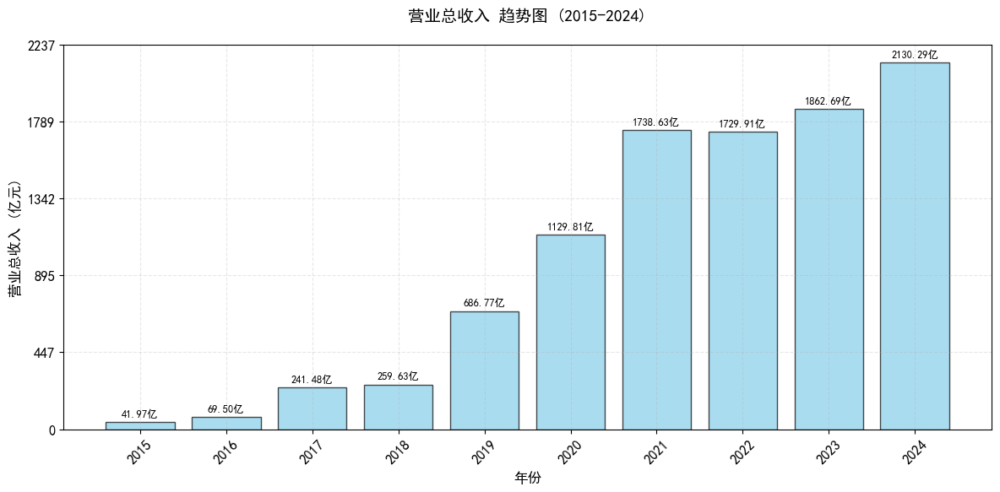

In [42]:
# net_profit_df = net_profit_df.set_index('指标')
plot_indicator_data(net_profit_df, '营业总收入', chart_type='bar')

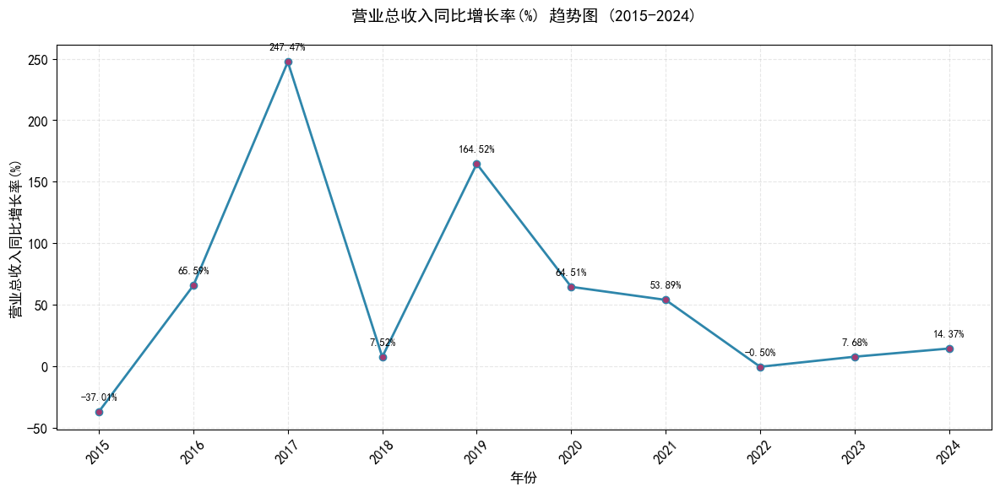

In [43]:
plot_indicator_data(net_profit_df, '营业总收入同比增长率(%)', chart_type='line')

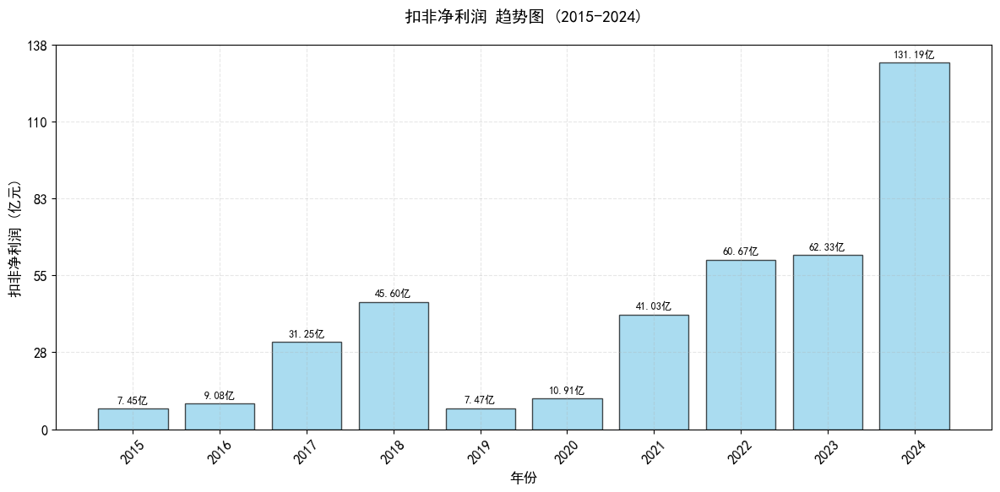

In [53]:
plot_indicator_data(net_profit_df, '扣非净利润', chart_type='bar')

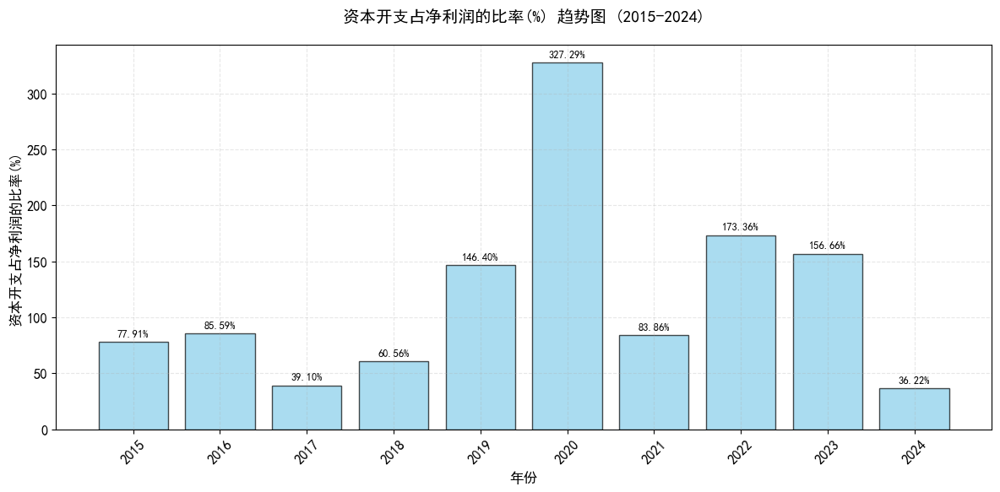

In [54]:
plot_indicator_data(net_profit_df, '资本开支占净利润的比率(%)', chart_type='bar')

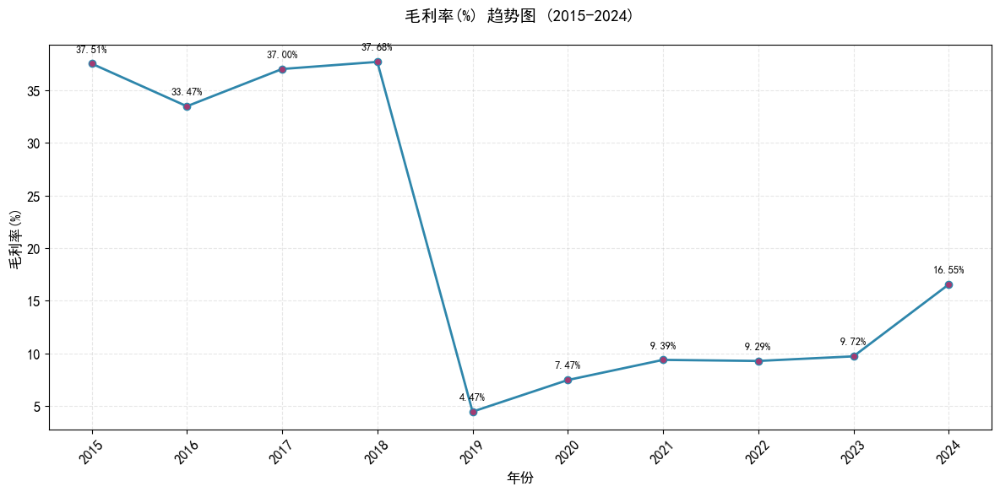

In [47]:
plot_indicator_data(v0_df, '毛利率(%)', chart_type='line')

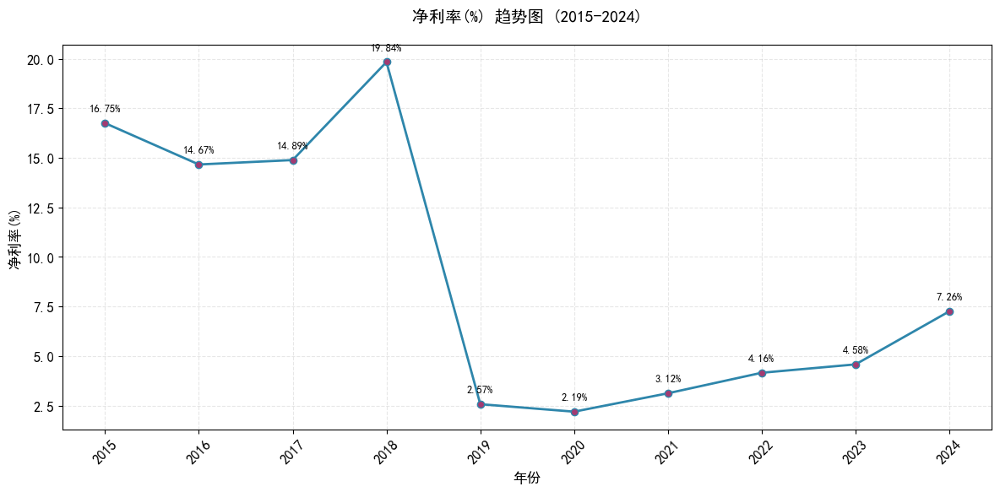

In [48]:
plot_indicator_data(v0_df, '净利率(%)', chart_type='line')

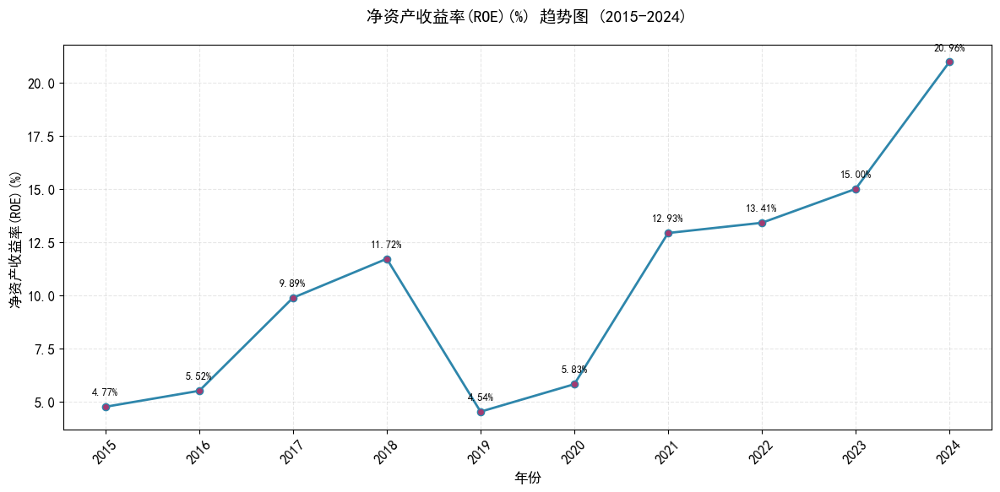

In [50]:
plot_indicator_data(v0_df, '净资产收益率(ROE)(%)', chart_type='line')

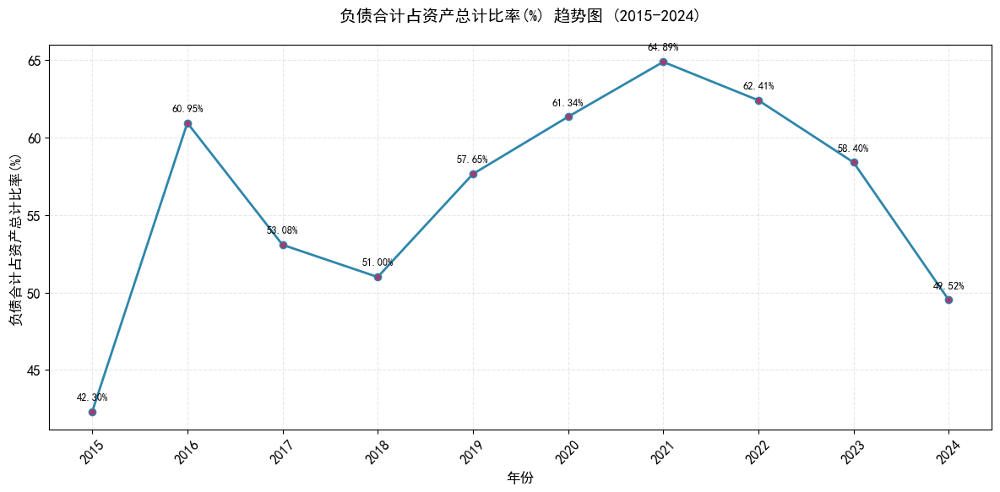

In [55]:
plot_indicator_data(v1_df, '负债合计占资产总计比率(%)', chart_type='line')

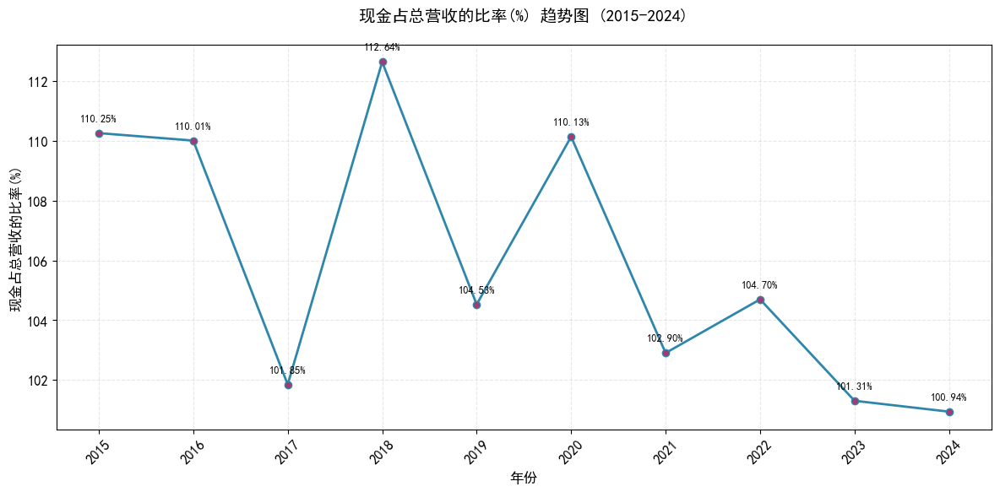

In [56]:
plot_indicator_data(net_profit_df, '现金占总营收的比率(%)', chart_type='line')